In [28]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
#pip3 install yfinance --upgrade --no-cache-dir

In [29]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
# plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Financial Data and Preprocessing 

## Getting data from Yahoo Finance

1. Import the libraries:

In [5]:
import pandas as pd 
import yfinance as yf

2. Download the data:

In [6]:
df_yahoo = yf.download('SPY', 
                       start='2010-01-01', 
                       end='2010-12-31',
                       progress=True)

[*********************100%***********************]  1 of 1 completed


3. Inspect the data:

In [7]:
print(f'Downloaded {df_yahoo.shape[0]} rows of data.')

df_yahoo.head()

Downloaded 251 rows of data.


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,112.370003,113.389999,111.510002,113.330002,88.454170,118944600
2010-01-05,113.260002,113.680000,112.849998,113.629997,88.688354,111579900
2010-01-06,113.519997,113.989998,113.430000,113.709999,88.750793,116074400
2010-01-07,113.500000,114.330002,113.180000,114.190002,89.125435,131091100
2010-01-08,113.889999,114.620003,113.660004,114.570000,89.422020,126402800


## Getting data from Quandl 

1. Import the libraries:

In [8]:
import pandas as pd 
import quandl

2. Authenticate using the personal API key:

In [11]:
QUANDL_KEY = 'UsZoEVzjKR2RjkwBzZsX' # replace {key} with your own API key  
quandl.ApiConfig.api_key = QUANDL_KEY

3. Download the data:

In [12]:
df_quandl = quandl.get(dataset='WIKI/AAPL',
                       start_date='2000-01-01', 
                       end_date='2010-12-31')

4. Inspect the data:

In [13]:
print(f'Downloaded {df_quandl.shape[0]} rows of data.')

df_quandl.head()

Downloaded 2767 rows of data.


,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2000-01-03,104.87,112.50,101.69,111.94,4783900.0,0.0,1.0,3.369314,3.614454,3.267146,3.596463,133949200.0
2000-01-04,108.25,110.62,101.19,102.50,4574800.0,0.0,1.0,3.477908,3.554053,3.251081,3.293170,128094400.0
2000-01-05,103.75,110.56,103.00,104.00,6949300.0,0.0,1.0,3.333330,3.552125,3.309234,3.341362,194580400.0
2000-01-06,106.12,107.00,95.00,95.00,6856900.0,0.0,1.0,3.409475,3.437748,3.052206,3.052206,191993200.0
2000-01-07,96.50,101.00,95.50,99.50,4113700.0,0.0,1.0,3.100399,3.244977,3.068270,3.196784,115183600.0


## Getting data from Intrinio

1. Import the libraries:

In [1]:
import intrinio_sdk
import pandas as pd

2. Authenticate using the personal API key and select the API:

In [4]:
intrinio_sdk.ApiClient().configuration.api_key['api_key'] = 'OjRkODg2OTI5YjAxYzVjZmM2NjFlN2Y2MzJhY2U0NjZl'  # replace {key} with your own API key  
security_api = intrinio_sdk.SecurityApi()

3. Request the data:

In [5]:
r = security_api.get_security_stock_prices(identifier='AAPL', 
                                           start_date='2000-01-01',
                                           end_date='2010-12-31', 
                                           frequency='daily',
                                           page_size=10000)

ApiException: (401)
Reason: Unauthorized
HTTP response headers: HTTPHeaderDict({'Date': 'Mon, 02 Jan 2023 11:55:51 GMT', 'Content-Type': 'application/json', 'Content-Length': '104', 'Connection': 'keep-alive', 'Vary': 'Origin,Accept-Encoding'})
HTTP response body: {"human":"No active subscription(s).","message":"An active subscription is required to view this data."}


4. Convert the results into a DataFrame:

In [8]:
response_list = [x.to_dict() for x in r.stock_prices]
df_intrinio = pd.DataFrame(response_list).sort_values('date')
df_intrinio.set_index('date', inplace=True)

5. Inspect the data:

In [9]:
print(f'Downloaded {df_intrinio.shape[0]} rows of data.')

df_intrinio.head()

Downloaded 2771 rows of data.


,intraperiod,frequency,open,high,low,close,volume,adj_open,adj_high,adj_low,adj_close,adj_volume
date,,,,,,,,,,,,
2000-01-03,False,daily,104.87,112.50,101.69,111.94,4783900.0,3.258837,3.495940,3.160019,3.478538,133949200.0
2000-01-04,False,daily,108.25,110.62,101.19,102.50,4574800.0,3.363871,3.437519,3.144481,3.185190,128094400.0
2000-01-05,False,daily,103.75,110.56,103.00,104.00,6949300.0,3.224033,3.435654,3.200727,3.231802,194580400.0
2000-01-06,False,daily,106.12,107.00,95.00,95.00,6856900.0,3.297681,3.325027,2.952127,2.952127,191993200.0
2000-01-07,False,daily,96.50,101.00,95.50,99.50,4113700.0,2.998739,3.138577,2.967664,3.091965,115183600.0


## Converting prices to returns

### How to do it...

1. Import the libraries:

In [6]:
import pandas as pd 
import numpy as np
import yfinance as yf

2. Download the data and keep the adjusted close prices only:

In [7]:
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31',
                 progress=False)

df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close':'adj_close'}, inplace=True)

In [8]:
df

,adj_close
Date,
2000-01-03,0.851942
2000-01-04,0.780115
2000-01-05,0.791531
2000-01-06,0.723033
2000-01-07,0.757282
...,...
2010-12-23,9.851514
2010-12-27,9.884392
2010-12-28,9.908444


3. Convert adjusted close prices to simple and log returns:

In [9]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

In [10]:
df

,adj_close,simple_rtn,log_rtn
Date,,,
2000-01-03,0.851942,NaN,NaN
2000-01-04,0.780115,-0.084310,-0.088078
2000-01-05,0.791531,0.014633,0.014527
2000-01-06,0.723033,-0.086539,-0.090514
2000-01-07,0.757282,0.047369,0.046281
...,...,...,...
2010-12-23,9.851514,-0.004798,-0.004809
2010-12-27,9.884392,0.003337,0.003332
2010-12-28,9.908444,0.002433,0.002430


4. Inspect the output:

In [38]:
df.head()

,adj_close,simple_rtn,log_rtn
Date,,,
1999-12-31,3.194901,NaN,NaN
2000-01-03,3.478462,0.088754,0.085034
2000-01-04,3.185191,-0.084311,-0.088078
2000-01-05,3.231803,0.014634,0.014528
2000-01-06,2.952128,-0.086538,-0.090514


### There's more

metemos inflación en el analisis

1. Import libraries and authenticate:

In [11]:
import pandas as pd
import quandl

QUANDL_KEY = 'UsZoEVzjKR2RjkwBzZsX' # replace {key} with your own API key  
quandl.ApiConfig.api_key = QUANDL_KEY

2. Create a DataFrame with all possible dates and left join the prices on it:

In [12]:
df_all_dates = pd.DataFrame(index=pd.date_range(start='1999-12-31', 
                                                end='2010-12-31'))
df = df_all_dates.join(df[['adj_close']], how='left') \
                 .fillna(method='ffill') \
                 .asfreq('M')

In [13]:
df

,adj_close
1999-12-31,NaN
2000-01-31,0.789628
2000-02-29,0.872397
2000-03-31,1.033652
2000-04-30,0.944224
...,...
2010-08-31,7.400813
2010-09-30,8.638343
2010-10-31,9.162882
2010-11-30,9.472494


3. Download inflation data from Quandl:

In [14]:
df_cpi = quandl.get(dataset='RATEINF/CPI_USA', 
                    start_date='1999-12-01', 
                    end_date='2010-12-31')
df_cpi.rename(columns={'Value':'cpi'}, inplace=True)

4. Merge inflation data to prices:

In [15]:
df_merged = df.join(df_cpi, how='left')

In [16]:
df_merged

,adj_close,cpi
1999-12-31,NaN,168.300
2000-01-31,0.789628,168.800
2000-02-29,0.872397,169.800
2000-03-31,1.033652,171.200
2000-04-30,0.944224,171.300
...,...,...
2010-08-31,7.400813,218.312
2010-09-30,8.638343,218.439
2010-10-31,9.162882,218.711
2010-11-30,9.472494,218.803


5. Calculate simple returns and inflation rate:

In [17]:
df_merged['simple_rtn'] = df_merged.adj_close.pct_change()
df_merged['inflation_rate'] = df_merged.cpi.pct_change()

In [18]:
df_merged

,adj_close,cpi,simple_rtn,inflation_rate
1999-12-31,NaN,168.300,NaN,NaN
2000-01-31,0.789628,168.800,NaN,0.002971
2000-02-29,0.872397,169.800,0.104820,0.005924
2000-03-31,1.033652,171.200,0.184842,0.008245
2000-04-30,0.944224,171.300,-0.086517,0.000584
...,...,...,...,...
2010-08-31,7.400813,218.312,-0.055005,0.001381
2010-09-30,8.638343,218.439,0.167215,0.000582
2010-10-31,9.162882,218.711,0.060722,0.001245
2010-11-30,9.472494,218.803,0.033790,0.000421


6. Adjust returns for inflation:

In [19]:
df_merged['real_rtn'] = (df_merged.simple_rtn + 1) / (df_merged.inflation_rate + 1) - 1
df_merged.head()

,adj_close,cpi,simple_rtn,inflation_rate,real_rtn
1999-12-31,NaN,168.3,NaN,NaN,NaN
2000-01-31,0.789628,168.8,NaN,0.002971,NaN
2000-02-29,0.872397,169.8,0.104820,0.005924,0.098313
2000-03-31,1.033652,171.2,0.184842,0.008245,0.175153
2000-04-30,0.944224,171.3,-0.086517,0.000584,-0.087050


## Changing frequency

0. Obtain the simple returns in case of starting in this recipe:

In [20]:
import pandas as pd 
import yfinance as yf

# download data 
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31', 
                 auto_adjust=False,
                 progress=False)

# keep only the adjusted close price
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

# calculate simple returns
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

# remove redundant data
df.drop('adj_close', axis=1, inplace=True)
df.dropna(axis=0, inplace=True)

df.head()

,log_rtn
Date,
2000-01-04,-0.088077
2000-01-05,0.014527
2000-01-06,-0.090514
2000-01-07,0.046281
2000-01-10,-0.017744


1. Import the libraries:

In [21]:
import pandas as pd 

2. Define the function for calculating the realized volatility:

In [22]:
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

3. Calculate monthly realized volatility:

In [23]:
df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)

In [24]:
df_rv

,rv
Date,
2000-01-31,0.236246
2000-02-29,0.147841
2000-03-31,0.243592
2000-04-30,0.212513
2000-05-31,0.184990
...,...
2010-08-31,0.060304
2010-09-30,0.065953
2010-10-31,0.069618


4. Annualize the values:

In [7]:
df_rv.rv = df_rv.rv * np.sqrt(12)

5. Plot the results:

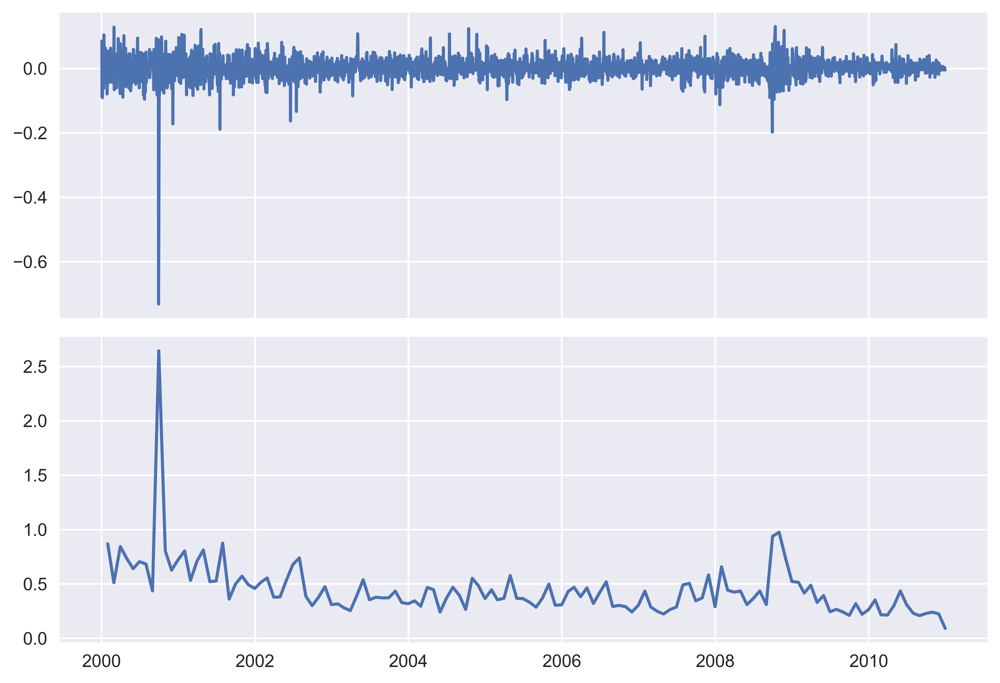

In [10]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(df)
ax[1].plot(df_rv)

# plt.tight_layout()
# plt.savefig('images/ch1_im6.png')
plt.show()

## Visualizing time series data

### Getting ready

In [30]:
import pandas as pd 
import yfinance as yf

# download data as pandas DataFrame
df = yf.download('MSFT', auto_adjust = False, progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

# create simple and log returns
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))

# dropping NA's in the first row
df.dropna(how = 'any', inplace = True)

In [31]:
df

,adj_close,simple_rtn,log_rtn
Date,,,
1986-03-14,0.062980,0.035713,0.035090
1986-03-17,0.064067,0.017250,0.017103
1986-03-18,0.062437,-0.025432,-0.025761
1986-03-19,0.061351,-0.017390,-0.017543
1986-03-20,0.059723,-0.026548,-0.026906
...,...,...,...
2022-12-23,238.729996,0.002267,0.002265
2022-12-27,236.960007,-0.007414,-0.007442
2022-12-28,234.529999,-0.010255,-0.010308


### How to do it...

#### the `plot` method of pandas

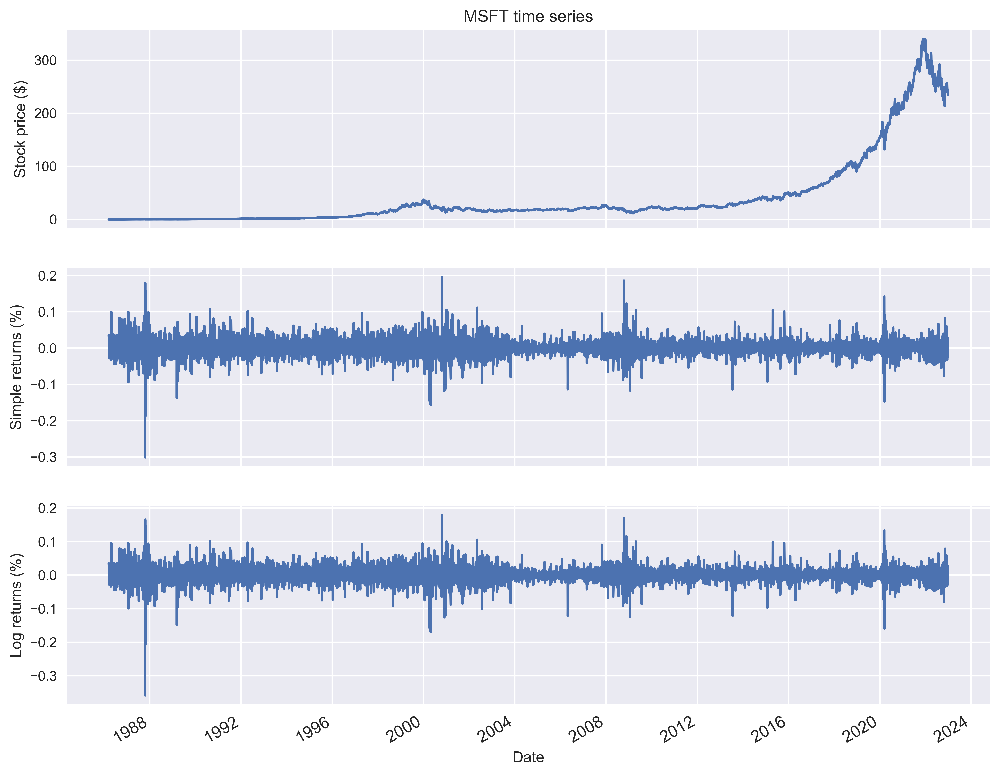

In [32]:
fig, ax = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

# add prices
df.adj_close.plot(ax=ax[0])
ax[0].set(title = 'MSFT time series',
          ylabel = 'Stock price ($)')
    
# add simple returns 
df.simple_rtn.plot(ax=ax[1])
ax[1].set(ylabel = 'Simple returns (%)')

# add log returns 
df.log_rtn.plot(ax=ax[2])
ax[2].set(xlabel = 'Date', 
          ylabel = 'Log returns (%)')

ax[2].tick_params(axis='x', 
                  which='major', 
                  labelsize=12)

# plt.tight_layout()
# plt.savefig('images/ch1_im7.png')
plt.show()

#### `plotly` + `cufflinks`

1. Import the libraries and handle the settings:

In [39]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

# set up settings (run it once)
# cf.set_config_file(world_readable=True, theme='pearl', 
#                    offline=True)

# initialize notebook display
init_notebook_mode()

2. Create the plots:

In [40]:
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True, title='MSFT time series')

KeyboardInterrupt: 

## Identifying outliers

0: Repeat the steps from recipe *Converting prices to returns*:

In [41]:
import pandas as pd 
import yfinance as yf

In [42]:
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31',
                 progress=False)

df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close':'adj_close'}, inplace=True)

In [43]:
df['simple_rtn'] = df.adj_close.pct_change()

In [44]:
df.head()

,adj_close,simple_rtn
Date,,
2000-01-03,0.851942,NaN
2000-01-04,0.780115,-0.084310
2000-01-05,0.791530,0.014633
2000-01-06,0.723033,-0.086538
2000-01-07,0.757282,0.047369


1. Calculate the rolling mean and standard deviation:

In [45]:
df_rolling = df[['simple_rtn']].rolling(window=21) \
                               .agg(['mean', 'std'])
df_rolling.columns = df_rolling.columns.droplevel()

2. Join the rolling metrics to the original data:

In [47]:
df_outliers = df.join(df_rolling)

3. Define a function for detecting outliers:

In [48]:
def indentify_outliers(row, n_sigmas=3):
    '''
    Function for identifying the outliers using the 3 sigma rule. 
    The row must contain the following columns/indices: simple_rtn, mean, std.
    
    Parameters
    ----------
    row : pd.Series
        A row of a pd.DataFrame, over which the function can be applied.
    n_sigmas : int
        The number of standard deviations above/below the mean - used for detecting outliers
        
    Returns
    -------
    0/1 : int
        An integer with 1 indicating an outlier and 0 otherwise.
    '''
    x = row['simple_rtn']
    mu = row['mean']
    sigma = row['std']
    
    if (x > mu + n_sigmas * sigma) | (x < mu - n_sigmas * sigma):
        return 1
    else:
        return 0 

4. Identify the outliers and extract their values for later use:

In [49]:
df_outliers['outlier'] = df_outliers.apply(indentify_outliers, 
                                           axis=1)
outliers = df_outliers.loc[df_outliers['outlier'] == 1, 
                           ['simple_rtn']]

5. Plot the results: 

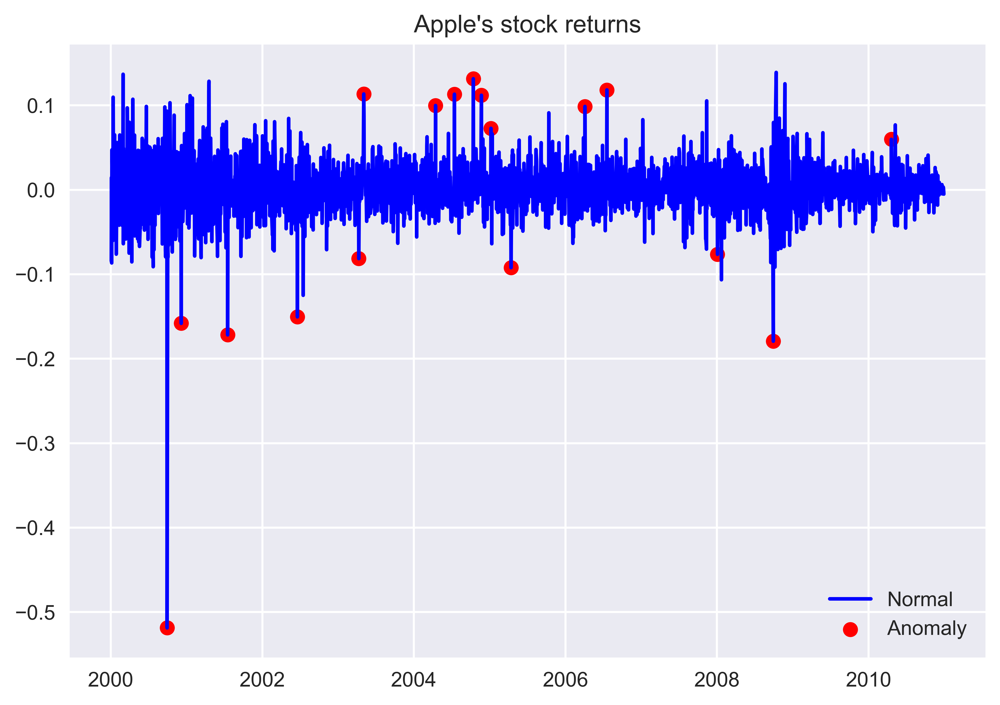

In [50]:
fig, ax = plt.subplots()

ax.plot(df_outliers.index, df_outliers.simple_rtn, 
        color='blue', label='Normal')
ax.scatter(outliers.index, outliers.simple_rtn, 
           color='red', label='Anomaly')
ax.set_title("Apple's stock returns")
ax.legend(loc='lower right')

# plt.tight_layout()
# plt.savefig('images/ch1_im9.png')
plt.show()

## Investigating stylized facts of asset returns

### How to do it...

1. Import the libraries:

In [52]:
import pandas as pd 
import numpy as np
import yfinance as yf
import seaborn as sns 
import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.tsa.api as smt

2. Download the S&P 500 data and calculate the returns:

In [53]:
df = yf.download('^GSPC', 
                 start='1985-01-01', 
                 end='2018-12-31',
                 progress=False)

df = df[['Adj Close']].rename(columns={'Adj Close': 'adj_close'})
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))
df = df[['adj_close', 'log_rtn']].dropna(how = 'any')

In [55]:
df

,adj_close,log_rtn
Date,,
1985-01-03,164.570007,-0.004849
1985-01-04,163.679993,-0.005423
1985-01-07,164.240005,0.003416
1985-01-08,163.990005,-0.001523
1985-01-09,165.179993,0.007230
...,...,...
2018-12-21,2416.620117,-0.020803
2018-12-24,2351.100098,-0.027487
2018-12-26,2467.699951,0.048403


#### Fact 1 - Non-Gaussian distribution of returns

hay que chequear la no existencia de non gaussian ( normal) distributions of returns

1. Calculate the Normal PDF using the mean and standard deviation of the observed returns:

In probability theory, a probability density function (PDF), or density of a continuous random variable, is a function whose value at any given sample (or point) in the sample space (the set of possible values taken by the random variable) can be interpreted as providing a relative likelihood that the value of the random variable would be equal to that sample.[2][3] Probability density is the probability per unit length, in other words, while the absolute likelihood for a continuous random variable to take on any particular value is 0 (since there is an infinite set of possible values to begin with), the value of the PDF at two different samples can be used to infer, in any particular draw of the random variable, how much more likely it is that the random variable would be close to one sample compared to the other sample

Q-Q plot: 

In [54]:
r_range = np.linspace(min(df.log_rtn), max(df.log_rtn), num=1000)
mu = df.log_rtn.mean()
sigma = df.log_rtn.std()
norm_pdf = scs.norm.pdf(r_range, loc=mu, scale=sigma)   

In [56]:
norm_pdf

array([5.03503905e-89, 9.27641792e-89, 1.70751792e-88, 3.14020310e-88,
       5.76975944e-88, 1.05916880e-87, 1.94258554e-87, 3.55961171e-87,
       6.51677316e-87, 1.19198306e-86, 2.17828683e-86, 3.97710951e-86,
       7.25483493e-86, 1.32219352e-85, 2.40752061e-85, 4.37978212e-85,
       7.96053949e-85, 1.44557290e-84, 2.62267814e-84, 4.75398161e-84,
       8.60949148e-84, 1.55777599e-83, 2.81604774e-83, 5.08607222e-83,
       9.17767204e-83, 1.65458868e-82, 2.98026624e-82, 5.36324432e-82,
       9.64289864e-82, 1.73218839e-81, 3.10878114e-81, 5.57432999e-81,
       9.98625619e-81, 1.78739375e-80, 3.19628331e-80, 5.71054821e-80,
       1.01933712e-79, 1.81788070e-79, 3.23907064e-79, 5.76611053e-79,
       1.02554096e-78, 1.82234482e-78, 3.23530781e-78, 5.73862913e-78,
       1.01697017e-77, 1.80059388e-77, 3.18515688e-77, 5.62928696e-77,
       9.93993285e-77, 1.75356155e-76, 3.09076569e-76, 5.44275332e-76,
       9.57588060e-76, 1.68324098e-75, 2.95611531e-75, 5.18685310e-75,
      

2. Plot the histogram and the Q-Q Plot:

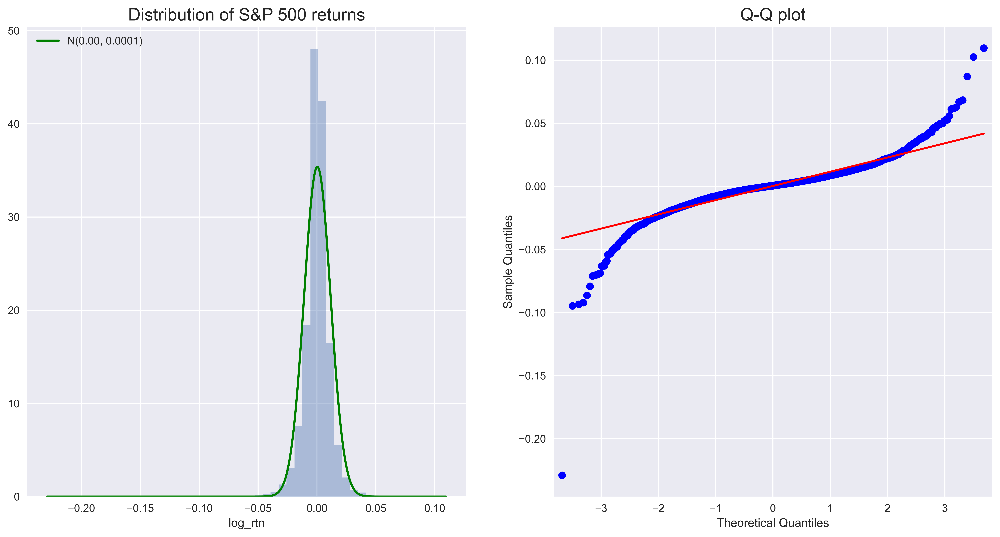

In [6]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# histogram
sns.distplot(df.log_rtn, kde=False, norm_hist=True, ax=ax[0])                                    
ax[0].set_title('Distribution of S&P 500 returns', fontsize=16)                                                    
ax[0].plot(r_range, norm_pdf, 'g', lw=2, 
           label=f'N({mu:.2f}, {sigma**2:.4f})')
ax[0].legend(loc='upper left');

# Q-Q plot
qq = sm.qqplot(df.log_rtn.values, line='s', ax=ax[1])
ax[1].set_title('Q-Q plot', fontsize = 16)

# plt.tight_layout()
# plt.savefig('images/ch1_im10.png')
plt.show()

3. Print the summary statistics of the log returns:

In [7]:
jb_test = scs.jarque_bera(df.log_rtn.values)

print('---------- Descriptive Statistics ----------')
print('Range of dates:', min(df.index.date), '-', max(df.index.date))
print('Number of observations:', df.shape[0])
print(f'Mean: {df.log_rtn.mean():.4f}')
print(f'Median: {df.log_rtn.median():.4f}')
print(f'Min: {df.log_rtn.min():.4f}')
print(f'Max: {df.log_rtn.max():.4f}')
print(f'Standard Deviation: {df.log_rtn.std():.4f}')
print(f'Skewness: {df.log_rtn.skew():.4f}')
print(f'Kurtosis: {df.log_rtn.kurtosis():.4f}') 
print(f'Jarque-Bera statistic: {jb_test[0]:.2f} with p-value: {jb_test[1]:.2f}')

---------- Descriptive Statistics ----------
Range of dates: 1985-01-02 - 2018-12-28
Number of observations: 8569
Mean: 0.0003
Median: 0.0006
Min: -0.2290
Max: 0.1096
Standard Deviation: 0.0113
Skewness: -1.2624
Kurtosis: 28.0111
Jarque-Bera statistic: 282076.61 with p-value: 0.00


#### Fact 2 - Volatility Clustering

1. Run the following code to visualize the log returns series:

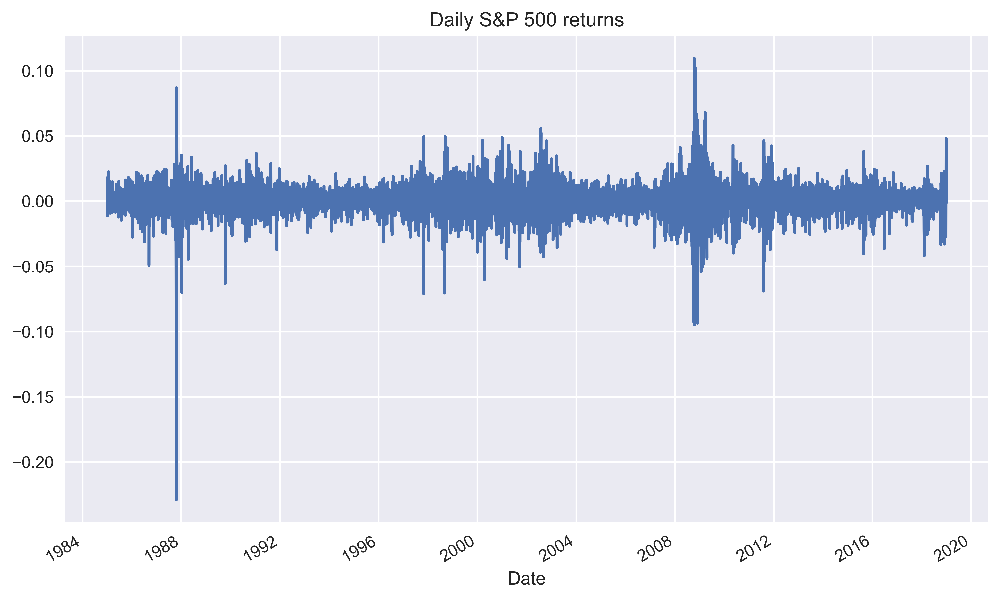

In [8]:
df.log_rtn.plot(title='Daily S&P 500 returns', figsize=(10, 6))

# plt.tight_layout()
# plt.savefig('images/ch1_im12.png')
plt.show()

#### Fact 3 - Absence of autocorrelation in returns

1. Define the parameters for creating the Autocorrelation plots:

In [9]:
N_LAGS = 50
SIGNIFICANCE_LEVEL = 0.05

2. Run the following code to create ACF plot of log returns:

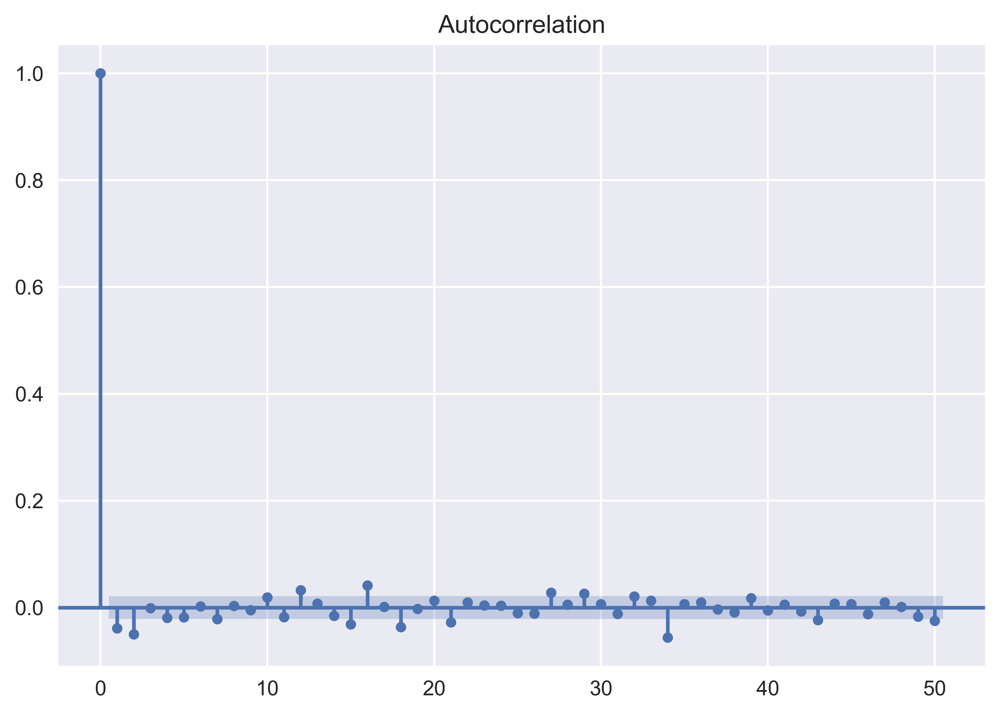

In [10]:
acf = smt.graphics.plot_acf(df.log_rtn, 
                            lags=N_LAGS, 
                            alpha=SIGNIFICANCE_LEVEL)

# plt.tight_layout()
# plt.savefig('images/ch1_im13.png')
plt.show()

#### Fact 4 - Small and decreasing autocorrelation in squared/absolute returns

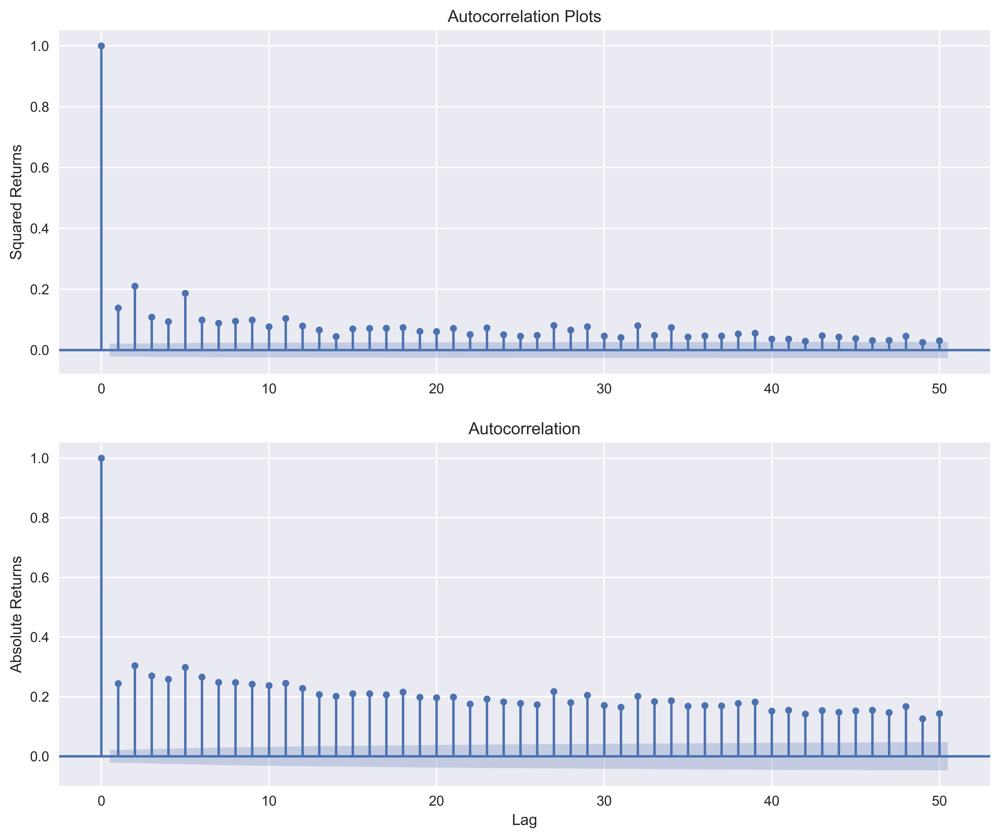

In [11]:
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

smt.graphics.plot_acf(df.log_rtn ** 2, lags=N_LAGS, 
                      alpha=SIGNIFICANCE_LEVEL, ax = ax[0])
ax[0].set(title='Autocorrelation Plots',
          ylabel='Squared Returns')

smt.graphics.plot_acf(np.abs(df.log_rtn), lags=N_LAGS, 
                      alpha=SIGNIFICANCE_LEVEL, ax = ax[1])
ax[1].set(ylabel='Absolute Returns',
          xlabel='Lag')

# plt.tight_layout()
# plt.savefig('images/ch1_im14.png')
plt.show()

#### Fact 5 - Leverage effect

1. Calculate volatility measures as moving standard deviations

In [12]:
df['moving_std_252'] = df[['log_rtn']].rolling(window=252).std()
df['moving_std_21'] = df[['log_rtn']].rolling(window=21).std()

2. Plot all the series:

In [13]:
fig, ax = plt.subplots(3, 1, figsize=(18, 15), 
                       sharex=True)

df.adj_close.plot(ax=ax[0])
ax[0].set(title='S&P 500 time series',
          ylabel='Price ($)')

df.log_rtn.plot(ax=ax[1])
ax[1].set(ylabel='Log returns (%)')

df.moving_std_252.plot(ax=ax[2], color='r', 
                       label='Moving Volatility 252d')
df.moving_std_21.plot(ax=ax[2], color='g', 
                      label='Moving Volatility 21d')
ax[2].set(ylabel='Moving Volatility',
          xlabel='Date')
ax[2].legend()

# plt.tight_layout()
# plt.savefig('images/ch1_im15.png')
plt.show()

### There's more

1. Download and preprocess the prices of S&P 500 and VIX:

In [14]:
df = yf.download(['^GSPC', '^VIX'], 
                 start='1985-01-01', 
                 end='2018-12-31',
                 progress=False)
df = df[['Adj Close']]
df.columns = df.columns.droplevel(0)
df = df.rename(columns={'^GSPC': 'sp500', '^VIX': 'vix'})

2. Calculate log returns:

In [15]:
df['log_rtn'] = np.log(df.sp500 / df.sp500.shift(1))
df['vol_rtn'] = np.log(df.vix / df.vix.shift(1))
df.dropna(how='any', axis=0, inplace=True)

3. Plot a scatterplot with the returns on the axes and fit a regression line to identify trend:

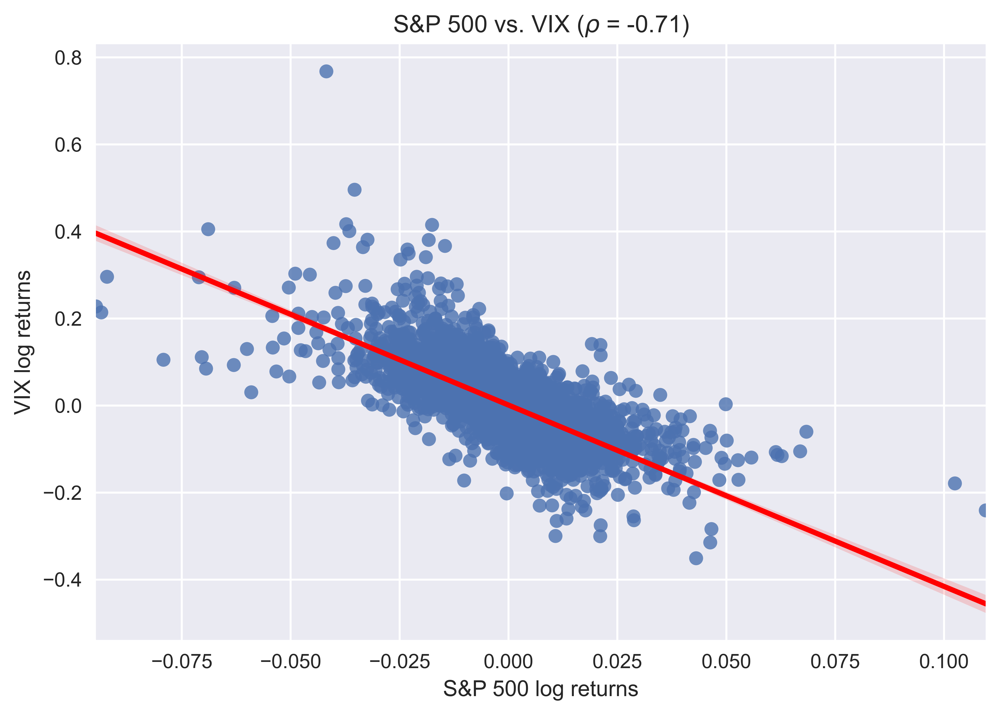

In [16]:
corr_coeff = df.log_rtn.corr(df.vol_rtn)

ax = sns.regplot(x='log_rtn', y='vol_rtn', data=df, 
                 line_kws={'color': 'red'})
ax.set(title=f'S&P 500 vs. VIX ($\\rho$ = {corr_coeff:.2f})',
       ylabel='VIX log returns',
       xlabel='S&P 500 log returns')

# plt.tight_layout()
# plt.savefig('images/ch1_im16.png')
plt.show()